# Report on the work on mathematical morphology

## Sorbonne University

**ANGELO MINIERI AND NICCOLO' ZOBOLI** - *Erasmus Students*

In [ ]:
import numpy as np
import platform
import tempfile
import os
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
from skimage import io as skio


import skimage.morphology as morpho
from skimage.segmentation import watershed
from skimage.draw import line
import skimage.feature as skf
from scipy import ndimage as ndi




## 2. Basic Morphological Operations

In [ ]:
def viewimage(im,normalise=True,MINI=0.0, MAXI=255.0):
    """ Cette fonction fait afficher l'image EN NIVEAUX DE GRIS
        dans gimp. Si un gimp est deja ouvert il est utilise.
        Par defaut normalise=True. Et dans ce cas l'image est normalisee
        entre 0 et 255 avant d'être sauvegardee.
        Si normalise=False MINI et MAXI seront mis a 0 et 255 dans l'image resultat

    """
    imt=np.float32(im.copy())
    if platform.system()=='Darwin': #on est sous mac
        prephrase='open -a GIMP '
        endphrase=' '
    elif platform.system()=='Linux': #SINON ON SUPPOSE LINUX (si vous avez un windows je ne sais comment faire. Si vous savez dites-moi.)
        prephrase='gimp '
        endphrase= ' &'
    elif platform.system()=='Windows':
        prephrase='start /B "D:/GIMP/bin/gimp-2.10.exe" -a '#Remplacer D:/... par le chemin de votre GIMP
        endphrase= ''
    else:
        print('Systeme non pris en charge par l affichage GIMP')
        return 'erreur d afficahge'
    if normalise:
        m=imt.min()
        imt=imt-m
        M=imt.max()
        if M>0:
            imt=imt/M

    else:
        imt=(imt-MINI)/(MAXI-MINI)
        imt[imt<0]=0
        imt[imt>1]=1

    nomfichier=tempfile.mktemp('TPIMA.png')
    commande=prephrase +nomfichier+endphrase
    skio.imsave(nomfichier,imt)
    os.system(commande)


def viewimage_color(im,normalise=True,MINI=0.0, MAXI=255.0):
    """ Cette fonction fait afficher l'image EN NIVEAUX DE GRIS
        dans gimp. Si un gimp est deja ouvert il est utilise.
        Par defaut normalise=True. Et dans ce cas l'image est normalisee
        entre 0 et 255 avant d'être sauvegardee.
        Si normalise=False MINI(defaut 0) et MAXI (defaut 255) seront mis a 0 et 255 dans l'image resultat

    """
    imt=np.float32(im.copy())
    if platform.system()=='Darwin': #on est sous mac
        prephrase='open -a GIMP '
        endphrase=' '
    elif platform.system()=='Linux': #SINON ON SUPPOSE LINUX (si vous avez un windows je ne sais comment faire. Si vous savez dites-moi.)
        prephrase='gimp '
        endphrase= ' &'
    elif platform.system()=='Windows':
        prephrase='start /B "D:/GIMP/bin/gimp-2.10.exe" -a '#Remplacer D:/... par le chemin de votre GIMP
        endphrase= ''
    else:
        print('Systeme non pris en charge par l affichage GIMP')
        return 'erreur d afficahge'

    if normalise:
        m=imt.min()
        imt=imt-m
        M=imt.max()
        if M>0:
            imt=imt/M
    else:
        imt=(imt-MINI)/(MAXI-MINI)
        imt[imt<0]=0
        imt[imt>1]=1

    nomfichier=tempfile.mktemp('TPIMA.pgm')
    commande=prephrase +nomfichier+endphrase
    skio.imsave(nomfichier,imt)
    os.system(commande)


def strel(forme,taille,angle=45):
    """renvoie un element structurant de forme
     'diamond'  boule de la norme 1 fermee de rayon taille
     'disk'     boule de la norme 2 fermee de rayon taille
     'square'   carre de cote taille (il vaut mieux utiliser taille=impair)
     'line'     segment de langueur taille et d'orientation angle (entre 0 et 180 en degres)
      (Cette fonction n'est pas standard dans python)
    """

    if forme == 'diamond':
        return morpho.diamond(taille)
    if forme == 'disk':
        return morpho.disk(taille)
    if forme == 'square':
        return morpho.square(taille)
    if forme == 'line':
        angle=int(-np.round(angle))
        angle=angle%180
        angle=np.float32(angle)/180.0*np.pi
        x=int(np.round(np.cos(angle)*taille))
        y=int(np.round(np.sin(angle)*taille))
        if x**2+y**2 == 0:
            if abs(np.cos(angle))>abs(np.sin(angle)):
                x=int(np.sign(np.cos(angle)))
                y=0
            else:
                y=int(np.sign(np.sin(angle)))
                x=0
        rr,cc=line(0,0,y,x)
        rr=rr-rr.min()
        cc=cc-cc.min()
        img=np.zeros((rr.max()+1,cc.max()+1) )
        img[rr,cc]=1
        return img
    raise RuntimeError('Erreur dans fonction strel: forme incomprise')



def couleurs_alea(im):
    """
    Donne des couleurs aleatoires a une image en niveau de gris.
    Cette fonction est utile lorsque le niveua de gris d'interprete comme un numero
      de region. Ou encore pour voir les leger degrades d'une teinte de gris.
      """
    sh=im.shape
    out=np.zeros((sh[0],sh[1],3),dtype=np.uint8)
    nbcoul=np.int32(im.max())
    tabcoul=np.random.randint(0,256,size=(nbcoul+1,3))
    tabcoul[0,:]=0
    for k in range(sh[0]):
        for l in range(sh[1]):
            out[k,l,:]=tabcoul[im[k,l]]
    return out

def gris_depuis_couleur(im):
    """ Transforme une image couleur en image a niveaux de gris"""
    return im[:,:,:3].sum(axis=2)/3

*1. Apply dilation, erosion, opening and closing with various structuring elements, by varying the shape and the size (functions morpho.dilation, morpho.erosion, morpho.opening, morpho.closing1 ).
What is the influence of the size and the shape of the structuring element?*
***

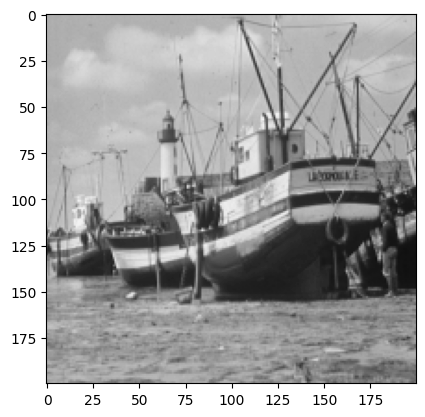

In [ ]:
im=skio.imread('bat200.bmp')
im=gris_depuis_couleur(im)
plt.imshow(im,cmap="gray",vmin=0, vmax=255)


## Dilation

Dilation expands the boundaries of objects in an image, and its effect is directly influenced by the size and shape of the structuring element (SE). A larger SE leads to more significant expansion of the objects, filling in small gaps and making the objects larger in all directions. The shape of the SE also matters: for example, a circular or disk-shaped SE will expand objects uniformly in all directions, preserving rounded structures, whereas a square or rectangular SE will cause more pronounced expansion along the horizontal and vertical axes. If the SE is elongated, like a line, dilation will occur more in the direction of elongation, enhancing structures in that particular direction while having a lesser impact on areas in other directions.

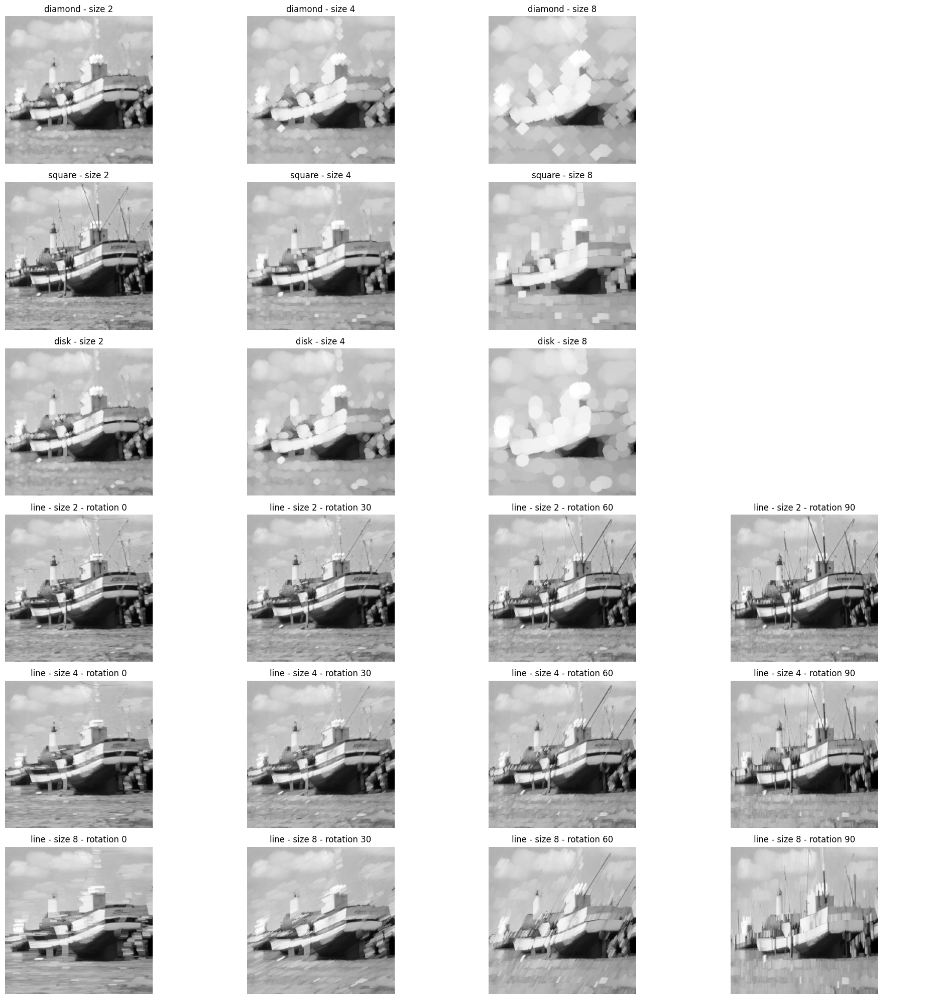

In [ ]:
fig, axs = plt.subplots(6, 4, figsize=(20, 20))

size_SE = {0: 2, 1: 4, 2: 8}
rotation_line_SE = {0: 0, 1: 30, 2: 60, 3: 90}

shapes = ['diamond', 'square', 'disk', 'line']

se_dict = {}
plot_dict = {}

for shape_idx, shape in enumerate(shapes):
  for size_idx in range(0,3):
    size = size_SE[size_idx]  # Rotate through size_SE based on shape index

    if shape == 'line':
      for rotation_idx in range(0,4):
        rotation = rotation_line_SE[rotation_idx]
        se_dict[shape] = strel(shape, size, rotation)
        result = morpho.dilation(im, se_dict[shape])

        ax = axs[shape_idx + size_idx, rotation_idx]
        ax.imshow(result, cmap='gray')
        ax.set_title(f'{shape} - size {size} - rotation {rotation}')
        ax.axis('off')
        plot_dict[shape] = result
    else:

      # Create and store structuring element in dictionary
      se_dict[shape] = strel(shape, size)

      # Perform the opening operation and store the result
      result = morpho.dilation(im, se_dict[shape])

      # Plot the result in one of the subplots
      ax = axs[shape_idx, size_idx]  # Determine subplot location (row, column)
      ax.imshow(result, cmap='gray')  # Display result as grayscale image
      ax.set_title(f'{shape} - size {size}')
      ax.axis('off')

      # Store the plot in the dictionary
      plot_dict[shape] = result

#removing axes for better visualization for the positions in which there will be no image
for i in range(0,3):
  axs[i, 3].axis('off')

plt.tight_layout()
plt.show()



## Erosion

Erosion, in contrast with dilation, shrinks the objects in the image by "eroding" away their boundaries. Like dilation, the size of the structuring element (SE) is crucial: a larger SE results in more significant shrinkage, potentially breaking small or thin objects apart. The shape of the SE dictates how the erosion occurs. A disk-shaped SE will erode objects uniformly, whereas a square SE will result in more angular erosion. An elongated SE will erode more in the direction of the SE, emphasizing features oriented in that direction and removing those perpendicular to it.

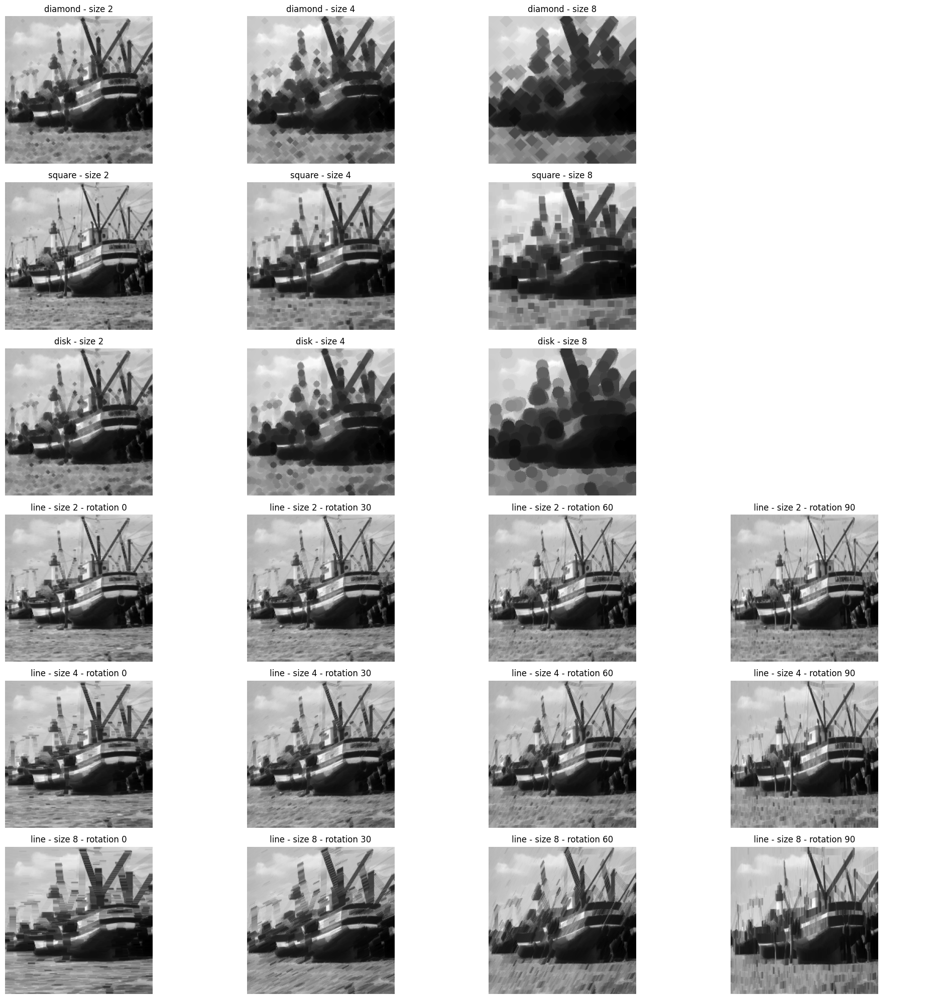

In [ ]:
fig, axs = plt.subplots(6, 4, figsize=(20, 20))

size_SE = {0: 2, 1: 4, 2: 8}
rotation_line_SE = {0: 0, 1: 30, 2: 60, 3: 90}

shapes = ['diamond', 'square', 'disk', 'line']

se_dict = {}
plot_dict = {}

for shape_idx, shape in enumerate(shapes):
  for size_idx in range(0,3):
    size = size_SE[size_idx]  # Rotate through size_SE based on shape index

    if shape == 'line':
      for rotation_idx in range(0,4):
        rotation = rotation_line_SE[rotation_idx]
        se_dict[shape] = strel(shape, size, rotation)
        result = morpho.erosion(im, se_dict[shape])

        ax = axs[shape_idx + size_idx, rotation_idx]
        ax.imshow(result, cmap='gray')
        ax.set_title(f'{shape} - size {size} - rotation {rotation}')
        ax.axis('off')
        plot_dict[shape] = result
    else:

      # Create and store structuring element in dictionary
      se_dict[shape] = strel(shape, size)

      # Perform the erosion operation and store the result
      result = morpho.erosion(im, se_dict[shape])

      # Plot the result in one of the subplots
      ax = axs[shape_idx, size_idx]  # Determine subplot location (row, column)
      ax.imshow(result, cmap='gray')  # Display result as grayscale image
      ax.set_title(f'{shape} - size {size}')
      ax.axis('off')

      # Store the plot in the dictionary
      plot_dict[shape] = result


for i in range(0,3):
  axs[i, 3].axis('off')

# Show all plots
plt.tight_layout()
plt.show()



## Opening

Opening, which consists of erosion followed by dilation, is heavily influenced by both the size and shape of the structuring element (SE). This operation is commonly used to remove small objects or noise from an image. A larger SE results in the removal of larger details, smoothing the overall shape of the remaining objects. The shape of the SE also dictates the types of features that are smoothed out. For instance, a disk-shaped SE will smooth out small protrusions and rounded corners, while a square SE will produce blockier, more geometric shapes. An elongated SE will preferentially remove thin structures that are not aligned with its orientation. This makes opening particularly useful for removing small isolated noise or objects that don't match the SE's shape.

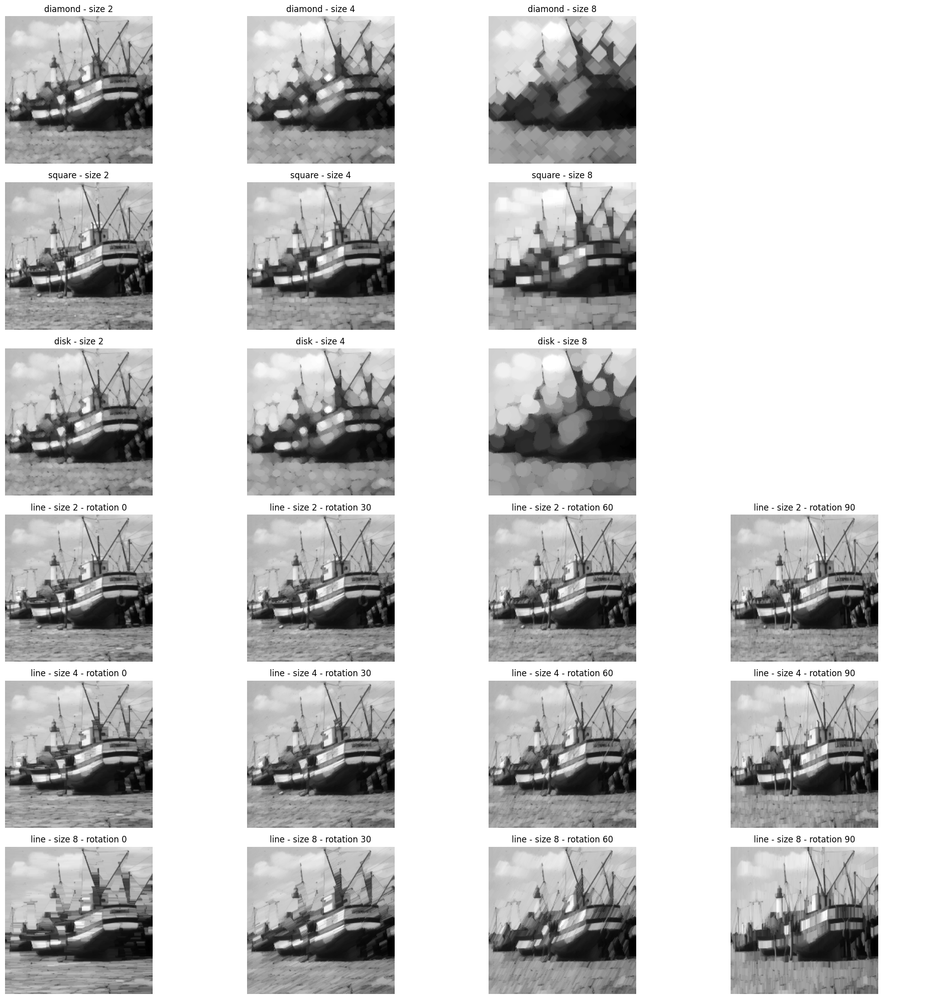

In [ ]:
fig, axs = plt.subplots(6, 4, figsize=(20, 20))

size_SE = {0: 2, 1: 4, 2: 8}
rotation_line_SE = {0: 0, 1: 30, 2: 60, 3: 90}

shapes = ['diamond', 'square', 'disk', 'line']

se_dict = {}
plot_dict = {}

for shape_idx, shape in enumerate(shapes):
  for size_idx in range(0,3):
    size = size_SE[size_idx]  # Rotate through size_SE based on shape index

    if shape == 'line':
      for rotation_idx in range(0,4):
        rotation = rotation_line_SE[rotation_idx]
        se_dict[shape] = strel(shape, size, rotation)
        result = morpho.opening(im, se_dict[shape])

        ax = axs[shape_idx + size_idx, rotation_idx]
        ax.imshow(result, cmap='gray')
        ax.set_title(f'{shape} - size {size} - rotation {rotation}')
        ax.axis('off')
        plot_dict[shape] = result
    else:

      # Create and store structuring element in dictionary
      se_dict[shape] = strel(shape, size)

      # Perform the opening operation and store the result
      result = morpho.opening(im, se_dict[shape])

      # Plot the result in one of the subplots
      ax = axs[shape_idx, size_idx]  # Determine subplot location (row, column)
      ax.imshow(result, cmap='gray')  # Display result as grayscale image
      ax.set_title(f'{shape} - size {size}')
      ax.axis('off')

      # Store the plot in the dictionary
      plot_dict[shape] = result


for i in range(0,3):
  axs[i, 3].axis('off')

# Show all plots
plt.tight_layout()
plt.show()



## Closing

Closing, which consists of dilation followed by erosion, has the opposite effect of opening: it is used to fill small holes or gaps in objects and to smooth object boundaries. A larger structuring element (SE) will fill in larger gaps and smooth out more substantial variations along the object's edge. The shape of the SE again determines the nature of the smoothing. A disk-shaped SE will round off sharp edges and fill in small holes uniformly, while a square SE will produce a more angular filling effect. An elongated SE will fill gaps preferentially in the direction of its elongation, making it useful for connecting small breaks in lines or ridges.

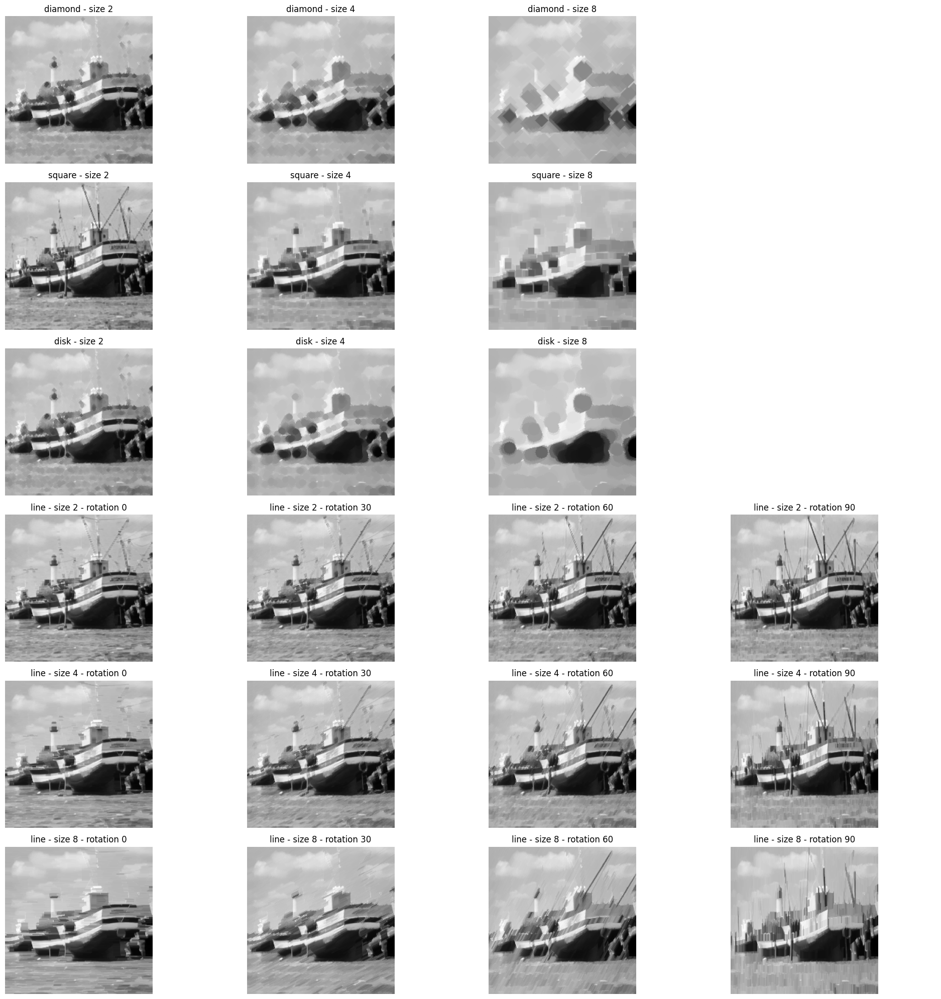

In [ ]:
fig, axs = plt.subplots(6, 4, figsize=(20, 20))

size_SE = {0: 2, 1: 4, 2: 8}
rotation_line_SE = {0: 0, 1: 30, 2: 60, 3: 90}

shapes = ['diamond', 'square', 'disk', 'line']

se_dict = {}
plot_dict = {}

for shape_idx, shape in enumerate(shapes):
  for size_idx in range(0,3):
    size = size_SE[size_idx]  # Rotate through size_SE based on shape index

    if shape == 'line':
      for rotation_idx in range(0,4):
        rotation = rotation_line_SE[rotation_idx]
        se_dict[shape] = strel(shape, size, rotation)
        result = morpho.closing(im, se_dict[shape])

        ax = axs[shape_idx + size_idx, rotation_idx]
        ax.imshow(result, cmap='gray')
        ax.set_title(f'{shape} - size {size} - rotation {rotation}')
        ax.axis('off')
        plot_dict[shape] = result
    else:

      # Create and store structuring element in dictionary
      se_dict[shape] = strel(shape, size)

      # Perform the closing operation and store the result
      result = morpho.closing(im, se_dict[shape])

      # Plot the result in one of the subplots
      ax = axs[shape_idx, size_idx]  # Determine subplot location (row, column)
      ax.imshow(result, cmap='gray')  # Display result as grayscale image
      ax.set_title(f'{shape} - size {size}')
      ax.axis('off')

      # Store the plot in the dictionary
      plot_dict[shape] = result


for i in range(0,3):
  axs[i, 3].axis('off')

# Show all plots
plt.tight_layout()
plt.show()



*3. What is the operation equivalent to the succession of a dilation by a square of size 3×3 and a dilation by a square of size 5 × 5? Same question for opening. What are the properties of these operations that explain the result?*
***

In the context of mathematical morphology, the result of combining two dilation operations or two opening operations depends on the properties of each operation and the structuring elements used.

### Dilation
Dilation is an operation that enlarges the bright areas of an image and shrinks the dark areas, based on the shape and size of the structuring element (SE). When you perform two dilations consecutively with different structuring element sizes, the effect is equivalent to performing a single dilation with a structuring element that is the union or combination of the two.

The result of a dilation with a 3x3 SE followed by a dilation with a 5x5 SE is equivalent to performing one dilation with a larger SE. In the image, you can see that the outcome of the successive dilations resembles the dilation by an 8x8 square SE (which, for practical reasons, is placed directly below the result of the two combined operations). This is because the dilation effect "compounds," and the final result can be approximated by using a structuring element that combines the two sizes.

This phenomenon is explained by the extensivity property of dilation, which ensures that each successive dilation operation enlarges the object boundaries by the size of the structuring element used. When applied consecutively, the dilation effects are cumulative and can be considered as one larger dilation.

(0.0, 1.0, 0.0, 1.0)

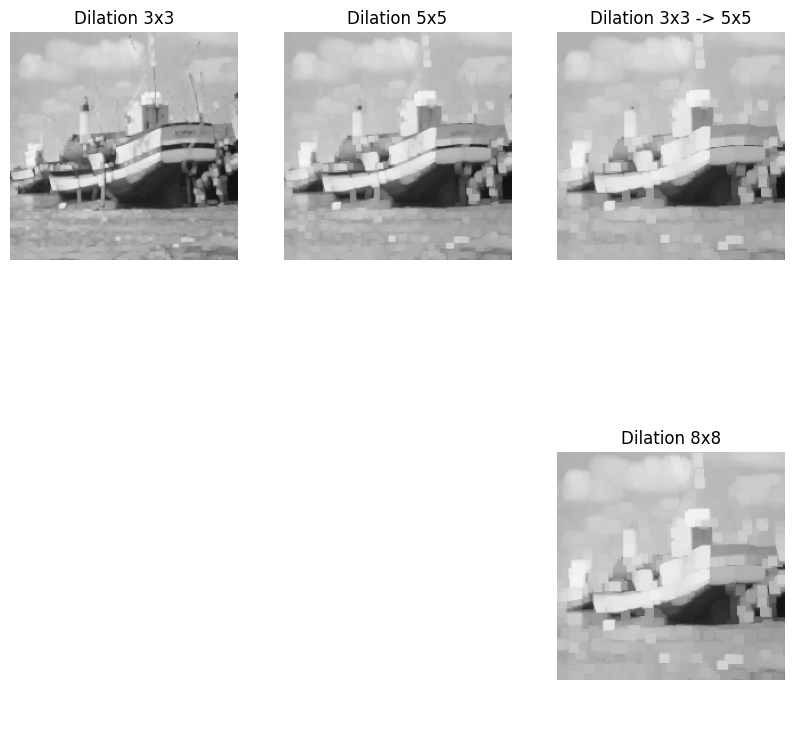

In [ ]:
#Applying dilation with square 3x3
se = strel('square', 3)
plot=morpho.dilation(im,se)

#applying dilation with square 5x5
se = strel('square', 5)
plt2 = morpho.dilation(im, se)

#applying dilation 5x5 after 3x3
plt3 = morpho.dilation(plot, se)

#applying dilation 8x8
se = strel('square', 8)
plt4 = morpho.dilation(im, se)

fig, axs = plt.subplots(2, 3, figsize=(10, 10))

axs[0,0].imshow(plot, cmap='gray', vmin=0, vmax=255)
axs[0, 0].set_title('Dilation 3x3')
axs[0,0].axis('off')

axs[0,1].imshow(plt2, cmap='gray', vmin=0, vmax=255)
axs[0, 1].set_title('Dilation 5x5')
axs[0,1].axis('off')

axs[0,2].imshow(plt3, cmap='gray', vmin=0, vmax=255)
axs[0, 2].set_title('Dilation 3x3 -> 5x5')
axs[0,2].axis('off')

axs[1,2].imshow(plt4, cmap='gray', vmin=0, vmax=255)
axs[1, 2].set_title('Dilation 8x8')
axs[1,2].axis('off')

axs[1,0].axis('off')
axs[1,1].axis('off')


### Opening
When applying an opening using a 3x3 structuring element followed by a 5x5 structuring element, the result is equivalent to an opening with the larger of the two structuring elements, which is 5x5 in this case. This occurs because the opening operation is idempotent, meaning that once an opening is performed with a certain structuring element size, subsequent openings with the same or smaller size will not change the result.

This behavior follows from the properties of the erosion operation that precedes dilation in opening: once an object has been eroded by a structuring element, further dilation doesn't undo the erosion beyond the initial element's effect. Hence, the result is effectively determined by the largest structuring element used.

In conclusion, for opening, applying a sequence of two structuring elements results in an operation equivalent to the largest structuring element used, confirming that the final output is the same as applying an opening with the larger 5x5 structuring element alone. The idempotent nature of the operation ensures that subsequent applications with smaller or equal structuring elements do not alter the result any further.

(-0.5, 199.5, 199.5, -0.5)

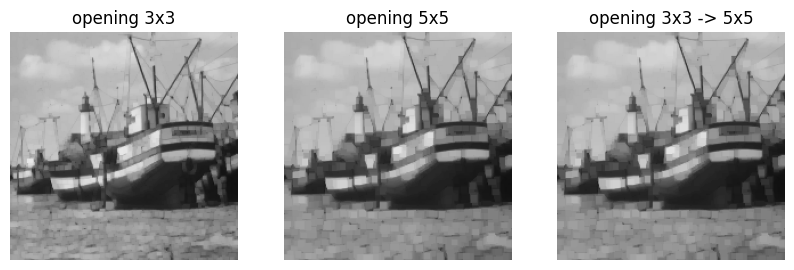

In [ ]:
#Applying opening with square 3x3
se = strel('square', 3)
plot=morpho.opening(im,se)

#applying opening with square 5x5
se = strel('square', 5)
plt2 = morpho.opening(im, se)

#applying opening 5x5 after 3x3
plt3 = morpho.opening(plot, se)

fig, axs = plt.subplots(1, 3, figsize=(10, 10))

axs[0].imshow(plot, cmap='gray', vmin=0, vmax=255)
axs[0].set_title('opening 3x3')
axs[0].axis('off')

axs[1].imshow(plt2, cmap='gray', vmin=0, vmax=255)
axs[1].set_title('opening 5x5')
axs[1].axis('off')

axs[2].imshow(plt3, cmap='gray', vmin=0, vmax=255)
axs[2].set_title('opening 3x3 -> 5x5')
axs[2].axis('off')


## 3. Top-Hat Transform

*4. Apply a top-hat transform (difference of the original image and its opening), for instance on image retina2.gif. Comment the result, according to the size and shape of the structuring element. What would be the dual operation (that you can illustrate on image laiton.bmp)?*
*** 
The top-hat transform is a morphological operation that highlights small bright structures in an image. It is defined as the difference between the original image and its opening by a structuring element.

The opening operation is essentially an erosion followed by dilation, which removes objects that are smaller than the structuring element.

### Observations

1. **Before the top-hat transform:**

   The first image shows the original grayscale image. It has many small bright structures such as vessels or nerves spread across the image.

2. **After top-hat of size 5:**

   Since the structuring element is small, only the smallest bright details are subtracted, so we can notice that the finer structures remain highlighted. Larger objects or regions are removed, leaving only small parts of the image.

3. **After top-hat of size 10:**

   With a size of 10, larger structures are filtered out. Fewer small objects are highlighted, and more details are subtracted compared to size 5.

4. **After top-hat of size 30:**

   By this stage, only much larger structures remain visible. Most of the smaller bright details have been removed. This filter size is effectively removing a lot of the fine structures, showing only the larger vessel structures.

5. **After top-hat of size 45:**

   With size 45, the structuring element is quite large, so the largest objects are subtracted. Only very few large-scale features or vessels remain visible. Small bright objects have been mostly removed, leaving just the largest features.

We can also notice some white regions on the edges, which are due to *border effects*. These effects occur because of how the morphological operations, such as opening and dilation, interact with the boundaries of the image. This happens because the chosen structuring element for the opening operation cannot fully fit within the borders of the image. When the structuring element reaches the edge, it extends beyond the image, leading to incomplete processing of the boundary pixels. This incomplete processing manifests as large differences between the original image and the opened one, which are especially visible in the top-hat transform results, where these differences appear as bright or white regions along the edges.

In particular, as the size of the structuring element increases, the problem becomes more pronounced. The larger the structuring element, the more it extends beyond the image boundaries, and the more significant the effect on the pixels at the edges.

Essentially, the operation behaves differently near the edges because the structuring element isn't able to interact with as much image data as it would in the central parts of the image. As a result, the difference between the original image and the processed image becomes larger near the edges, leading to bright or exaggerated results at those boundaries.

One way to mitigate this issue is to "pad" the image before applying morphological operations. Padding adds extra space around the image, so the structuring element has room to operate even near the edges without falling outside the image's boundaries. This way, the morphological operations can be applied uniformly across the entire image, including the border areas.

Following the original code, padding is implemented to address these issues.

The dual operation of the top-hat is called the black-hat transform. While the top-hat transform extracts small bright regions, the black-hat transform extracts small dark regions. It is defined as the difference between the closing of an image and the original image.

---

## Black Hat

### Before black hat:
The first image shows the original grayscale image. The image contains bright, well-defined structures or boundaries between different regions. There are small dark regions or gaps present along these boundaries.

### After black hat:

As the structuring element size increases in the black-hat transform, the results progressively emphasize larger dark regions. With a small size of 5, the transform highlights fine, small dark features along the boundaries. At size 10, these features become slightly more pronounced, though the overall pattern remains similar. By size 30, the focus shifts to larger dark regions, with the finer details merging into more connected dark areas along the boundaries. Finally, at size 45, the largest dark gaps are emphasized, while smaller features are filtered out, resulting in a clearer focus on the broader dark regions within the image.


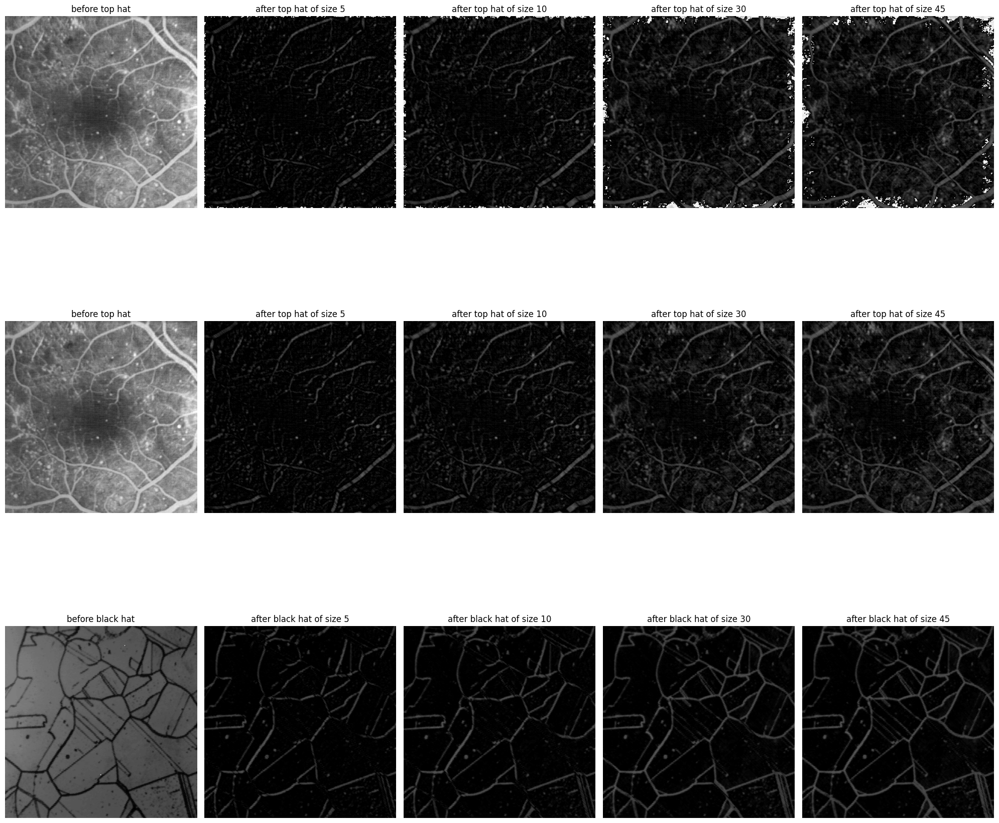

In [ ]:
fig, axs = plt.subplots(3,5, figsize=(20, 20))
im=skio.imread('retina2.gif')
im = np.squeeze(im)
axs[0, 0].imshow(im, cmap = 'gray', vmin = 0, vmax = 255)
axs[0, 0].set_title('before top hat')
axs[0, 0].axis('off')

se_dict = {}
i = 1

#after top hat
for t in (5,10,30,45):

  se_dict[t]=strel('line',t,-45)
  ch=im-morpho.opening(im,se_dict[t])
  axs[0, i].imshow(ch, cmap = 'gray', vmin = 0, vmax = 255)
  axs[0, i].set_title(f'after top hat of size {t}')
  axs[0, i].axis('off')
  i += 1

##using padding
# Show original image
axs[1, 0].imshow(im, cmap='gray', vmin=0, vmax=255)
axs[1, 0].set_title('before top hat')
axs[1, 0].axis('off')

# Initialize dictionary for structuring elements
se_dict = {}
i = 1

# Define padding size (should be at least as large as the largest structuring element)
pad_size = 45  # Padding equal to the largest structuring element size

# Pad the image using 'reflect' mode to reduce edge artifacts
padded_im = np.pad(im, pad_width=pad_size, mode='reflect')

# After top-hat with different structuring element sizes
for t in (5, 10, 30, 45):
    # Create structuring element
    se_dict[t] = strel('line', t, -45)

    # Apply opening on the padded image
    opened = morpho.opening(padded_im, se_dict[t])

    # Perform top-hat: original padded image - opened image
    ch = padded_im - opened

    # Crop the result back to the original image size
    cropped_ch = ch[pad_size:-pad_size, pad_size:-pad_size]

    # Display the result
    axs[1, i].imshow(cropped_ch, cmap='gray', vmin=0, vmax=255)
    axs[1, i].set_title(f'after top hat of size {t}')
    axs[1, i].axis('off')
    i += 1

##black_hat
im_laiton = skio.imread('laiton.bmp')
im_laiton=gris_depuis_couleur(im_laiton)

# Setup figure for black-hat results
axs[2,0].imshow(im_laiton, cmap='gray', vmin=0, vmax=255)
axs[2,0].set_title('before black hat')
axs[2,0].axis('off')

# Perform black-hat transform for different structuring element sizes
se_dict_black = {}
i = 1
for t in (5, 10, 30, 45):
    se_dict_black[t] = strel('line', t, -45)  # Adjust structuring element shape and size
    black_hat = morpho.closing(im_laiton, se_dict_black[t]) - im_laiton  # Black-hat operation
    axs[2,i].imshow(black_hat, cmap='gray', vmin=0, vmax=255)
    axs[2,i].set_title(f'after black hat of size {t}')
    axs[2,i].axis('off')
    i += 1

plt.tight_layout()
plt.show()




*5. Define segments in several directions, apply an opening with each of them as structuring element, and compute the point-wise maximum of the results. Conclusion?*
***
By applying the opening with a line structuring element in several directions and computing the point-wise maximum, we effectively enhance linear features in the image, regardless of their orientation. This technique allows for the extraction of linear structures such as vessels or ridges, which are preserved in at least one of the directions. In the results, the most prominent linear features that span multiple orientations become more visible, while smaller or noise-like structures are progressively removed.

The final output highlights the most significant linear elements present in the image across various directions. By computing the maximum, structures that align with any of the chosen directions are emphasized, while non-linear or randomly oriented noise is suppressed. This ensures that the most important linear features in the image are clearly defined, and irrelevant details are minimized.

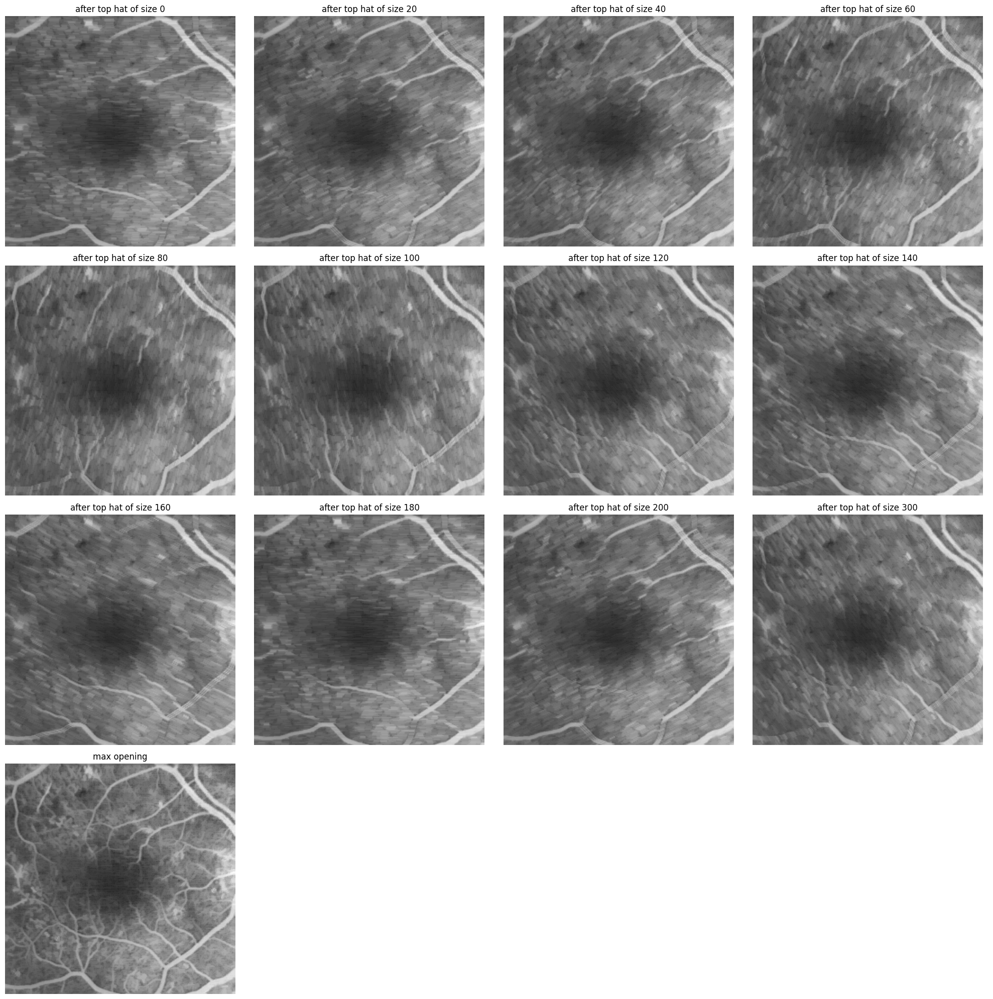

In [ ]:
fig, axs = plt.subplots(4,4, figsize=(20, 20))
se_dict = {}

opened_images = []

max_opening = np.zeros_like(im)

i=0
# After top-hat with line SE with different orientations
for t in (0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 300):

    se_dict[t] = strel('line', 5, t)

    opened = morpho.opening(im, se_dict[t])

    opened_images.append(opened)

    axs[i // 4, i %4].imshow(opened, cmap='gray', vmin=0, vmax=255)
    axs[i // 4, i % 4].set_title(f'after top hat of size {t}')
    axs[i // 4, i % 4].axis('off')
    i += 1

#compute the point-wise maximum of all the images
max_opening = np.maximum.reduce(opened_images)
axs[3,0].imshow(max_opening, cmap='gray', vmin=0, vmax=255)
axs[3,0].set_title('max opening')
axs[3,0].axis('off')

for i in range(1, 4):
    axs[3, i].axis('off')

plt.tight_layout()
plt.show()

## 4. Alternate Sequential Filters

*Define an alternate sequential filter. Use different shapes for the structuring element and vary the maximum size. Comment the results.
What will be obtained if the sequence is continued with larger and larger structuring elements?*
***
We implemented **alternate sequential filtering** using morphological operations, specifically an opening followed by a closing. The filtering process begins with the original image, *im*. In the first step, we apply an opening followed by a closing using a **disk-shaped structuring element** with varying sizes.

As shown in the results, we can observe that **smaller structuring elements** (e.g., size 1 and size 2) have a minimal smoothing effect, preserving finer details and maintaining much of the image's texture. As the **disk size increases** (e.g., sizes 3, 4, and 5), the smoothing effect becomes more pronounced. The filter removes finer structures and noise, resulting in a more **blurred appearance** where only the larger, dominant features of the image remain.

### **Considerations:**
- With **smaller structuring elements**, the filtering process primarily affects noise and very small details, while larger structures such as the vessels remain intact. This is evident in the images for sizes 1 and 2, where the blood vessels and other details are still well-defined.
- As the **disk size increases**, the filtering process smooths out more details. This can be seen in sizes 4 and 5, where the image becomes progressively more blurred, and only the large structures, such as the central dark region, remain prominent.
- The larger disk sizes tend to **remove finer textures and small features**, leaving only the more significant regions in the image. While this can be useful for isolating large objects, excessive smoothing might lead to the loss of important fine details.

Additionally, using different shapes for the structuring elements (e.g., disks, squares, crosses) would alter how the filter interacts with the image. Each shape has varying sensitivity to different orientations and features, so the **choice of the structuring element** should be carefully considered based on the specific image processing goals. However, in this case, the disk-shaped element provides a balanced, isotropic smoothing effect, which is ideal for highlighting circular or curved features in the image.


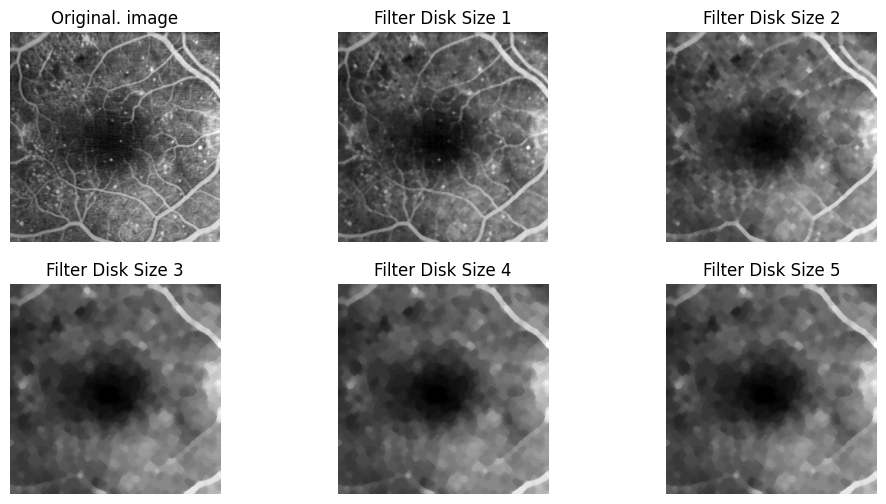

In [ ]:
im = skio.imread('retina2.gif')
im = np.squeeze(im)

se1=strel("disk",1)
se2=strel("disk",2)
se3=strel("disk",3)
se4=strel("disk",4)
se5=strel("disk",5)

fas1=morpho.closing(morpho.opening(im, se1), se1)
fas2=morpho.closing(morpho.opening(fas1, se2), se2)
fas3=morpho.closing(morpho.opening(fas2, se3), se3)
fas4=morpho.closing(morpho.opening(fas3, se3), se3)
fas5=morpho.closing(morpho.opening(fas4, se3), se3)
plt.figure(figsize=(12, 6))   #plotting
plt.subplot(231), plt.imshow(im, cmap= "gray"), plt.title('Original. image'), plt.axis('off')
plt.subplot(232), plt.imshow(fas1, cmap= "gray"), plt.title('Filter Disk Size 1'), plt.axis('off')
plt.subplot(233), plt.imshow(fas2, cmap= "gray"), plt.title('Filter Disk Size 2'), plt.axis('off')
plt.subplot(234), plt.imshow(fas3, cmap= "gray"), plt.title('Filter Disk Size 3'), plt.axis('off')
plt.subplot(235), plt.imshow(fas4, cmap= "gray"), plt.title('Filter Disk Size 4'), plt.axis('off')
plt.subplot(236), plt.imshow(fas5, cmap= "gray"), plt.title('Filter Disk Size 5'), plt.axis('off')
plt.show()

## 5.   Reconstruction

*1. The reconstruction of an image from its opening allow recovering small details of objects that are partially kept by the opening. Comment the result.*
***
The image shows the result of reconstructing an image from its opening. In this process, small details that were partially removed during the opening operation are recovered.

The opening operation removes small details and noise from the image. The vessels, which are prominent features in the image, remain intact, but smaller, finer structures and noise are removed. The opening smooths out the image but at the cost of losing some smaller details that may be relevant to the analysis.

When we reconstruct the image from the opened version, the goal is to recover details that were partially removed by the erosion stage of the opening operation. The reconstruction process "grows back" regions of the image that were removed during the opening, but only in areas where they match the original image.

As a result, the vessels remain well-defined and more continuous. The reconstruction restores some of the finer details that were removed during opening, particularly smaller vessels and branches that were lost in the original opening process.

### **Effect of Reconstruction**:
The reconstruction restores the significant features that were partially eroded. However, the noise or irrelevant small features that were completely removed by opening are not reintroduced. This provides a cleaner, more refined version of the image, where small but important structures are recovered without compromising the overall noise reduction achieved by the opening.


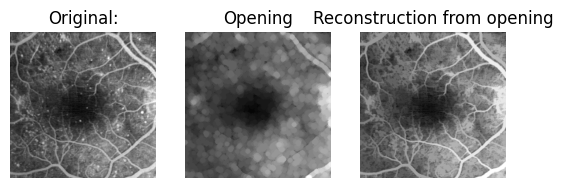

In [68]:
im = skio.imread("retina2.gif")
im = np.squeeze(im)

se4 = strel("disk", 4)
open4 = morpho.opening(im, se4)   #opening
reco = morpho.reconstruction(open4, im)     #dilatation

plt.subplot(131), plt.imshow(im, cmap= "gray"), plt.title(f'Original:'), plt.axis('off')
plt.subplot(132), plt.imshow(open4, cmap= "gray"), plt.title('Opening'), plt.axis('off')
plt.subplot(133), plt.imshow(reco, cmap= "gray"), plt.title('Reconstruction from opening'), plt.axis('off')
plt.show()

*2. Write the sequence of operators for a reconstruction by erosion. How could this reconstruction be derived from a reconstruction by dilation using duality principle?*
***

In the given approach, the reconstruction by erosion follows a sequence of morphological operations. First, a closing is applied to the image, which smooths the boundaries and fills small holes. Then, a reconstruction by erosion is performed, which restores the finer details that were partially removed during the closing. This method preserves significant structures, like vessels, while reducing noise. The image on the left, labeled as "Reconstruction by Erosion," illustrates this effect, where the main features are intact and the background is smoother.

The reconstruction by erosion can also be derived using the duality principle, which links erosion and dilation. To apply this principle, the image is first inverted and a reconstruction by dilation is performed on the inverted version. Afterward, the result is inverted back to obtain the equivalent of a reconstruction by erosion on the original image. The result, shown on the right as "Reconstruction by Duality Principle," is similar to the direct reconstruction by erosion. Both methods yield comparable outcomes, with slight differences in how fine details are preserved. The duality principle provides an alternative way to achieve the same result, confirming the complementary nature of dilation and erosion.




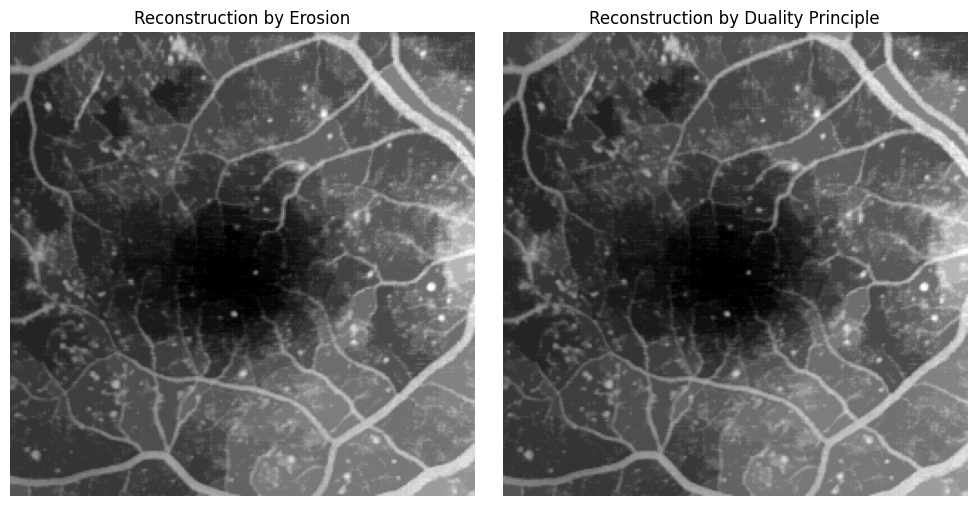

In [80]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
# Erosion operation with the same structuring element (disk of size 4)
im=skio.imread('retina2.gif')
im=np.squeeze(im)
se4=strel('disk',4)
clos4=morpho.closing(im,se4)
reco=morpho.reconstruction(clos4,im, method='erosion')
axs[0].imshow(reco,cmap='gray')
axs[0].set_title('Reconstruction by Erosion')
axs[0].axis('off')

# Duality principle: Reconstruction by erosion derived from reconstruction by dilation
# Invert the original image
im_inverted = np.max(im) - im  # Invert the image by subtracting from max intensity

ope_inverted = morpho.opening(im_inverted, se4)

# Reconstruction by dilation on the inverted image
reco_dilation_inverted = morpho.reconstruction(ope_inverted, im_inverted, method='dilation')

# Invert back the result to get equivalent reconstruction by erosion
reco_erosion_from_dilation = np.max(im) - reco_dilation_inverted

axs[1].imshow(reco_erosion_from_dilation, cmap='gray')
axs[1].set_title('Reconstruction by Duality Principle')
axs[1].axis('off')

plt.tight_layout()
plt.show()

*3. Add a reconstruction operation at each step of the alternate sequential filter (reconstruction by dilation after each opening and reconstruction by erosion after each closing).
Comment the results.*
***
In this step, we applied an **alternate sequential filter**, where each stage alternates between opening and closing operations on the image. To make the process more robust, we introduced a morphological reconstruction after each operation.

After the opening, which removes noise and smaller details, we performed a **reconstruction by dilation**. This step is crucial because it restores the finer details that might have been removed during the opening operation. Following that, we applied a closing operation to remove small gaps or holes in the image, and then carried out a **reconstruction by erosion**. This final phase helps preserve the larger structures, ensuring that the key information in the image remains intact.

The overall result of this process is a more effectively filtered image, where important details are either preserved or restored, while noise and unnecessary small features are removed.



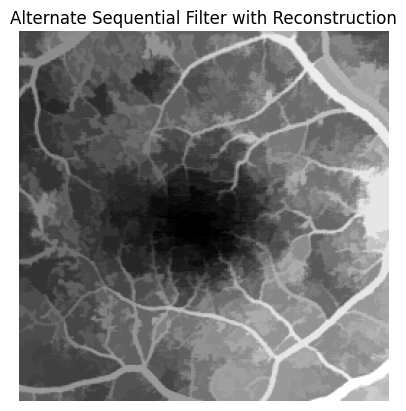

In [81]:
open = morpho.opening(im, se4)
reco1_dil = morpho.reconstruction(open, im, method='dilation')
clos = morpho.closing(reco1_dil, se4)
reco1_ero = morpho.reconstruction(clos, reco1_dil, method='erosion')

#result
plt.imshow(reco1_ero, cmap="gray")
plt.title("Alternate Sequential Filter with Reconstruction")
plt.axis('off')
plt.show()


## 6. Segmentation and Watershed Algorithm


*1. Compute the morphological gradient (dilation - erosion with an elementary structuring element, of size 1), for instance on image bat200.bmp. Comment the results.*
***

The **morphological gradient** emphasizes the edges or boundaries of structures within the image, as we can see from the resulting image below. Dilation expands bright areas, while erosion reduces them. The gradient hence highlights the regions where these operations differ the most, typically corresponding to edges or transitions between light and dark regions in the image.

As we can observe from the result, the edges and contours of the boats and structures are clearly highlighted. This is because the morphological gradient captures the variations in intensity between adjacent pixels, particularly at object boundaries where there is a significant change in intensity. The finer details of the image, such as the rigging on the boats and other small structures, are well-defined. These details correspond to areas where the intensity changes rapidly, and the morphological gradient makes them stand out against the background. The background areas with relatively uniform intensity, such as the sky and water, are largely suppressed. These areas do not have significant intensity transitions, so the gradient operation has little effect there.

As we can easily understand from the result, the **morphological gradient** is a powerful tool for edge detection. It effectively highlights boundaries and transitions between different regions of intensity in the image, making it useful for identifying object outlines and emphasizing the structural details of the image. In this case, the gradient has enhanced the edges of the boats and other elements in the scene, giving a clearer representation of the image's main features. However, some noise or minor details in the background may also appear, as the gradient can accentuate small variations in intensity.



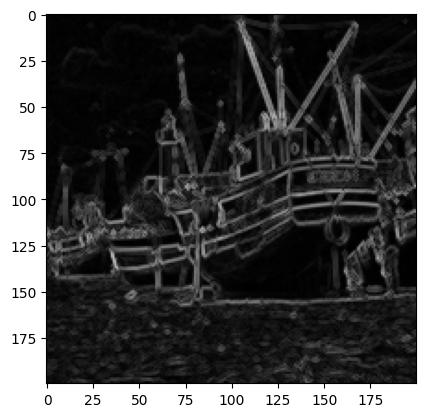

In [71]:
im=skio.imread('bat200.bmp')
im=gris_depuis_couleur(im)
se=strel('disk',1)
dil=morpho.dilation(im,se)
ero=morpho.erosion(im,se)

grad = dil - ero
plt.imshow(grad,cmap="gray",vmin=0, vmax=255)


*2. Compute the watershed on this gradient image (see the corresponding section in the code).
Comment the results. For the visualization, the watershed lines (having value 0 in the result) can be superimposed on the original image.*
***

In the resulting image, the **watershed lines**, which separate different regions or segments, are superimposed on the original image and are visualized as white contours.

The **watershed algorithm** is a region-based segmentation method that treats the image like a topographic surface, where high-intensity areas represent ridges and low-intensity areas represent valleys. The watershed lines (the white contours) represent the boundaries between different regions or "basins" formed by the segmentation process.

In our image, the watershed lines are placed at the boundaries of distinct regions, particularly around the edges of the boats and other elements in the scene. These boundaries correspond to areas where there are significant intensity transitions, as detected by the morphological gradient.

The result shows the segmentation boundaries overlaid on the original image. These boundaries follow the edges of objects like the boats, masts, and other structures quite well, highlighting the contours of different parts of the scene.

However, the segmentation might also pick up on small variations in texture or noise, resulting in **over-segmentation** in some areas. For example, we can see some small, scattered boundaries where there may not be meaningful objects in the image.

The watershed algorithm can sometimes be sensitive to small variations in the gradient. This is visible in the fine, small contours scattered across the image, especially in areas with textures or slight intensity variations. This could be mitigated by applying some form of pre-processing, such as smoothing the image or using markers to guide the watershed segmentation.

In conclusion, the watershed algorithm applied here has successfully identified and outlined many of the prominent objects and structures in the image, especially around the boats. However, the result also includes small and potentially insignificant boundaries due to sensitivity to noise or minor variations in the gradient. This is typical behavior of watershed segmentation when applied without specific markers, leading to over-segmentation in some cases. To refine the result, one could consider pre-processing the image to reduce noise or using **marker-based watershed segmentation**, where manually or automatically defined markers help guide the segmentation process more effectively.


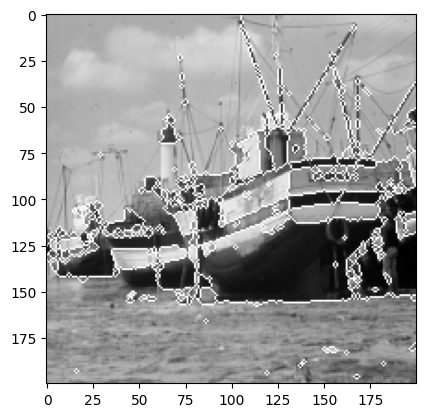

In [72]:
grad2=np.int32(grad>40)*grad
plt.imshow(grad2,cmap="gray")

local_mini = skf.peak_local_max(255-grad2)
mask = np.zeros(im.shape, dtype=bool)
mask[tuple(local_mini.T)] = True
markers, _ = ndi.label(mask)
plt.imshow(mask,cmap="gray")

labels = watershed(grad2, markers, mask=im, watershed_line=True)
#labels = watershed(grad2, markers,watershed_line=True)
plt.imshow(couleurs_alea(labels))
# viewimage_color(couleurs_alea(labels)) - Utilisable si gimp est installé

# visualization of the result
segm=labels.copy()
for i in range(segm.shape[0]):
    for j in range(segm.shape[1]):
        if segm[i,j] == 0:
            segm[i,j]=255
        else:
            segm[i,j]=0
#superimposition of segmentation contours on the original image
contourSup=np.maximum(segm,im)
plt.imshow(contourSup,cmap="gray")

*3. Try to improve the result by filtering the original image by an appropriate morphological filter and/or by filtering the gradient image by a closing, before computing the watersheds*
***

In this approach, we attempt to improve the **watershed segmentation** by filtering the gradient image with a **morphological closing** before computing the watersheds. The closing operation helps to smooth the gradient by filling in small gaps and removing minor noise, which can often lead to over-segmentation when left unprocessed. The main focus is on observing the effect of applying **line-shaped structuring elements** of varying sizes on the closing operation and how this influences the final segmentation result.

In terms of the visualization, the watershed lines, which represent the segmentation boundaries, will vary based on the size of the structuring element used for closing. For smaller shapes, these lines will follow intricate paths, capturing a lot of fine detail. In general, larger structuring elements will result in a coarser segmentation, where only the most prominent regions of the image are delineated. Smaller structuring elements will lead to a finer segmentation, capturing more detailed features, but also introducing more small and potentially irrelevant segments.

Overall, the use of **closing before watershed segmentation** helps control the level of detail captured by the algorithm. Smaller SEs allow for detailed segmentation, focusing on major structures while eliminating noise and minor features. This approach highlights how structuring element size can be used to balance detail and smoothness in segmentation tasks.

At first, I applied the watershed without using a threshold, and the results from the filtered gradient image were notably better. This shows that the closing operation helped reduce noise and refine the segmentation, particularly when the gradient image was more complex and noisy. However, after applying a threshold, the difference between the normal and filtered images became less pronounced. This suggests that in the case of a well-thresholded gradient image, the segmentation boundaries are already clearly defined, and the closing operation doesn't add much additional improvement. In such cases, the thresholding step alone is sufficient to achieve good results.


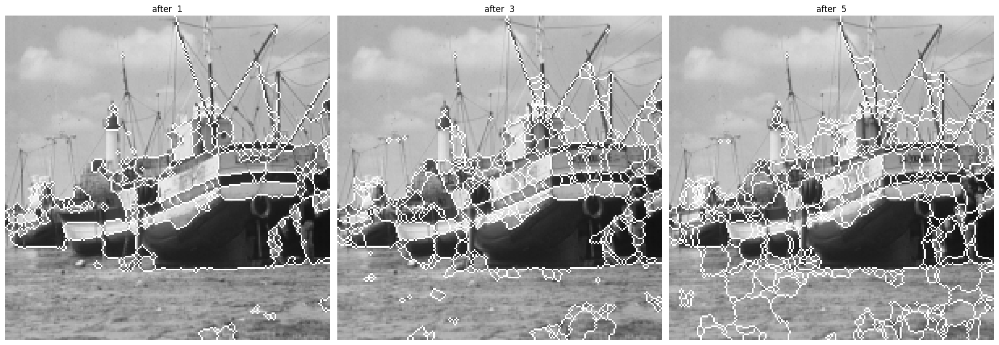

In [73]:
fig, axs = plt.subplots(1,3, figsize=(20, 20))
k = 0

im=skio.imread('bat200.bmp')
im=gris_depuis_couleur(im)
se_grad=strel('disk',1)

dil=morpho.dilation(im,se_grad)
ero=morpho.erosion(im,se_grad)

grad = dil - ero

for t in (1,3,5):

  se = strel('disk', t)
  grad_closing = morpho.closing(grad, se)

  grad_tresh=np.int32(grad_closing>40)*grad_closing

  local_mini = skf.peak_local_max(255-grad_tresh)
  mask = np.zeros(im.shape, dtype=bool)
  mask[tuple(local_mini.T)] = True
  markers, _ = ndi.label(mask)


  labels = watershed(grad_tresh, markers, mask=im, watershed_line=True)
  #labels = watershed(grad2, markers,watershed_line=True)
  plt.imshow(couleurs_alea(labels))
  # viewimage_color(couleurs_alea(labels)) - Utilisable si gimp est installé

  # visualization of the result
  segm=labels.copy()
  for i in range(segm.shape[0]):
      for j in range(segm.shape[1]):
          if segm[i,j] == 0:
              segm[i,j]=255
          else:
              segm[i,j]=0
  #superimposition of segmentation contours on the original image
  contourSup=np.maximum(segm,im)

  axs[k].imshow(contourSup, cmap='gray', vmin=0, vmax=255)
  axs[k].set_title(f'after  {t}')
  axs[k].axis('off')

  k += 1

plt.tight_layout()
plt.show()



*5.  Define markers (manually or using a dedicated pre-processing), inside the object to be segmented, and outside of it (e.g. on the image border). Let m be the marker, such that m takes value 0 in the marked regions and 255 elsewhere. Compute I ′ = I ∧ m, where I is the image on which we want to compute the watershed (e.g. gradient, or the inverted image in the case of laiton.bmp, etc.). Reconstruct I′ by erosion from m. The reconstructed image should have minima only in the regions defined by m. Compute the watersheds of the reconstructed image. Comment the results.*
***

We have in this case defined manually the markers. The foreground marker is placed in the middle of the image (e.g. within the object to be segmented), while the background markers are placed along the borders of the image. These markers will control the flooding process of the watershed, ensuring that only meaningful regions are segmented.

At this point, we have combined the marker image with the original image using a bitwise AND. This step restricts the image's intensity to the regions defined by the markers. Then, by performing an erosion from the marker image, we reconstruct the image with the predefined minima.

The watershed is then computed on the reconstructed image. Since the minima are now restricted to the regions defined by the markers, the watershed will produce more meaningful boundaries. The foreground marker ensures that the object is properly segmented, while the background markers along the borders prevent the watershed from flooding irrelevant regions.

### Expected Results

After applying the watershed algorithm to the reconstructed image, we should expect much cleaner segmentation boundaries. The use of markers guides the segmentation, preventing over-segmentation and making the algorithm focus on the regions of interest.

By guiding the watershed algorithm with predefined markers, we should eliminate, or at least reduce, the problem of over-segmentation and ensure that the detected boundaries correspond to meaningful structures in the image. The resulting segmentation should hence be more robust, less sensitive to noise, and focused only on the relevant parts of the image.

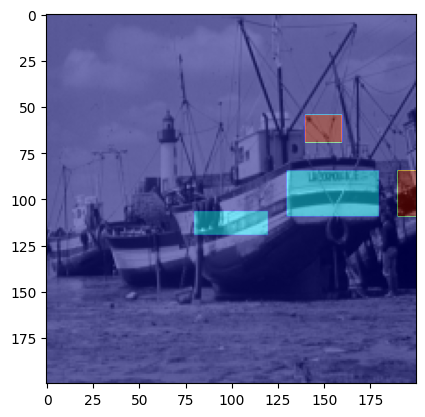

In [74]:
# Load and preprocess the image
image = skio.imread('bat200.bmp')
image = gris_depuis_couleur(image)  # Convert to grayscale if needed

markers = np.zeros_like(image)

markers[85:110, 130:180] = 1  # Set the foreground marker
markers[107:120, 80:120] = 1

markers[55:70,140:160]=3
markers[85:110, 190:200] = 3

plt.imshow(im, cmap='gray')
plt.imshow(markers, cmap='jet', alpha  = 0.5)
plt.show()



## Results

In the image below, the results of the watershed segmentation are superimposed on the original image. On the left, we see the original image of the boat, while on the right, the watershed segmentation lines are shown as white contours over the same image.

The segmentation successfully identifies and highlights the boundaries of the boat in the scene. The watershed lines closely follow the edges of the boat and its surrounding structures, particularly around the hull and masts. This shows that the watershed algorithm, when guided by markers, can effectively outline the major objects in the image.

However, the segmentation does introduce some over-segmentation in certain areas. The white contours extend beyond the boat's edges, capturing some of the noise or minor intensity variations around the background objects. This could be further refined by adjusting the marker placement or pre-processing the image, such as by applying a smoothing operation to reduce noise and avoid over-segmentation.

In summary, the watershed segmentation has effectively captured the major structures in the image, with the boat being the most prominent segmented object. The manual definition of markers has helped focus the segmentation on meaningful areas, but further refinements could improve the result by reducing over-segmentation in less relevant regions of the image.

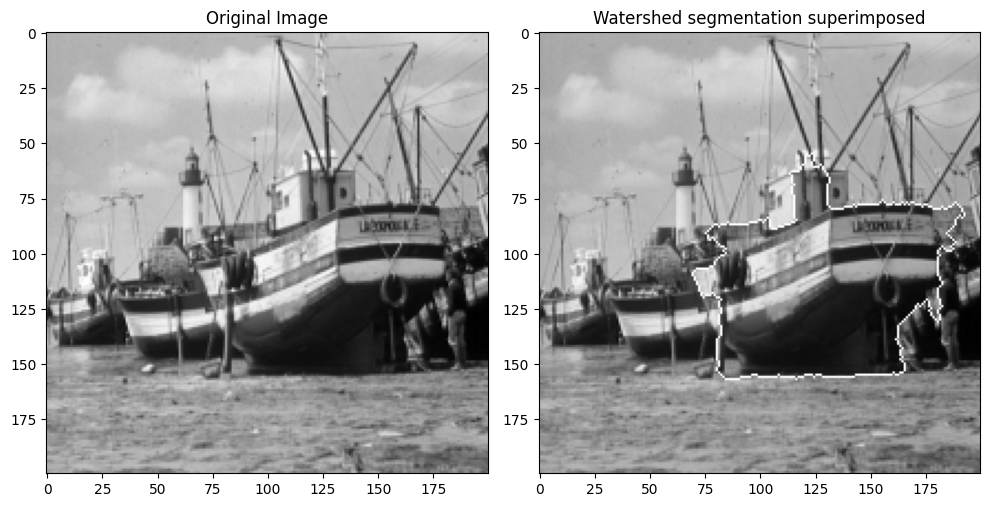

In [75]:
# Load and preprocess the image
image = skio.imread('bat200.bmp')
image = gris_depuis_couleur(image)  # Convert to grayscale if needed

se = strel('disk', 1)
dilated = morpho.dilation(image, se)
eroded = morpho.erosion(image, se)
grad = dilated - eroded

markers = np.zeros_like(image, dtype=np.uint8)

markers[85:110, 130:180] = 1  # Set the foreground marker
markers[107:120, 80:120] = 1

markers[0, :] = 2
markers[-1,:] = 2
markers[:,0] = 2
markers[:,-1] = 2
markers[55:70,140:160]=2
markers[85:110, 190:200] = 2

labels = watershed(grad, markers=markers, mask=im, watershed_line=True)

segmentation_result = np.zeros_like(image)

segmentation_result[labels==0] = 255 #mark watershed lines as white

contour_superimposed = np.maximum(image, segmentation_result)



plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.subplot(122)
plt.imshow(contour_superimposed, cmap='gray')
plt.title('Watershed segmentation superimposed')

plt.tight_layout()
plt.show()



*6.  How could the watersheds be used to segment the black lines in image bulles.bmp or laiton.bmp? Discuss the different steps of the method you propose.*
***

To use the watershed algorithm for segmenting the black lines in images such as `laiton.bmp`, we can apply a structured method, as illustrated by the code below.

After computing the gradient, we can define the markers, which are essential for the watershed algorithm to determine where the flooding process begins. These markers can be set manually or automatically. In our case, we have defined markers both inside the regions (foreground) and outside the regions (background).


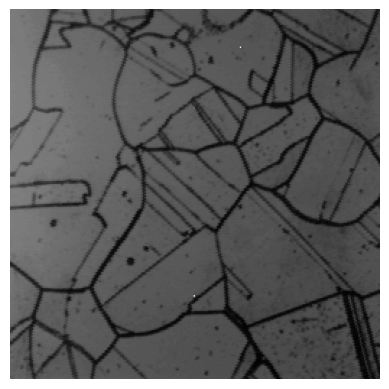

In [82]:
im = skio.imread('laiton.bmp')
im = gris_depuis_couleur(im)

plt.imshow(im, cmap='gray')
plt.axis('off')
plt.show()

The foreground markers are placed manually in areas where we expect different regions to be segmented.

The background markers are instead automatically detected based on the intensity of the image. Dark areas of the image (which likely correspond to the spaces between the regions or within the black lines) are marked as the background.

By defining both foreground and background markers, we are guiding the watershed algorithm to flood from the foreground markers through the regions separated by the black lines, while also ensuring that the flooding doesn't cross into the dark areas marked as the background.


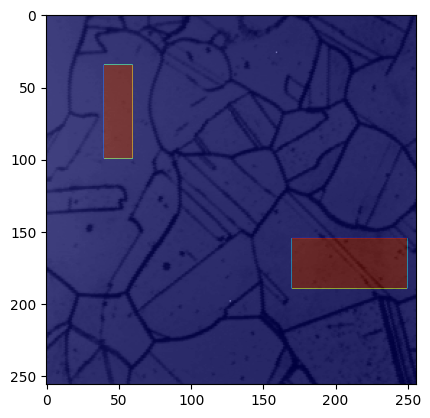

In [77]:
markers = np.zeros_like(im)

markers[35:100, 40:60] = 1  # Set the foreground marker
markers[155:190, 170:250] = 1  # Set the foreground marker


plt.imshow(im, cmap='gray')
plt.imshow(markers, cmap='jet', alpha  = 0.5)
plt.show()

Once the markers are defined, the watershed algorithm is applied to the gradient image. The watershed floods the regions starting from the markers, and the flooding stops at the boundaries, which in this case are the black lines.

The watershed algorithm, as applied in this method, successfully segments the black lines in the image by following the transitions in intensity (the black lines) using a morphological gradient. By defining markers inside the regions (foreground) and in dark areas (background), we ensure that the algorithm segments the regions separated by these lines.

To get a more complete result, more markers should be defined inside the different regions. In this example, some of them are defined, and the results are promising.


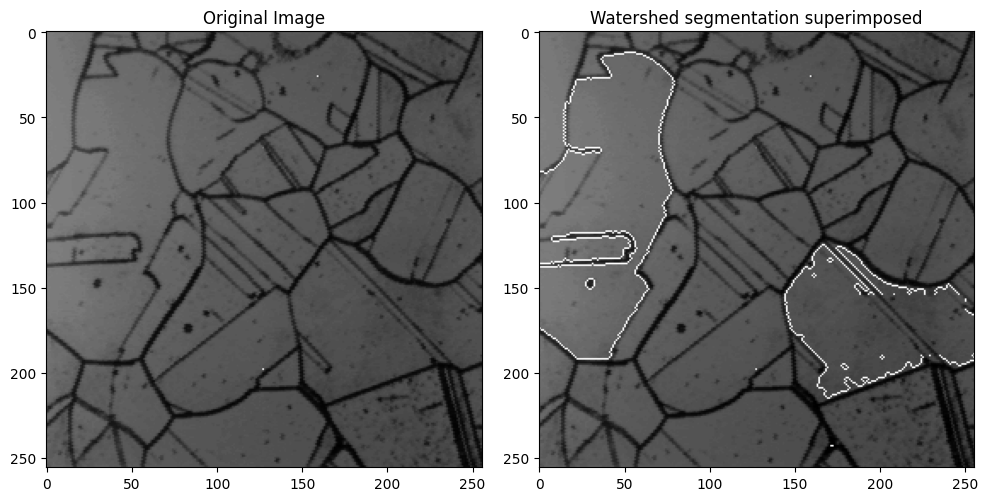

In [78]:
image = skio.imread('laiton.bmp')
image = gris_depuis_couleur(image)

se = strel('disk', 1)
dilated = morpho.dilation(image, se)
eroded = morpho.erosion(image, se)
grad = dilated - eroded

markers = np.zeros_like(image, dtype=np.uint8)

markers[35:100, 40:60] = 1  # Set the foreground marker
markers[155:190, 170:250] = 1  # Set the foreground marker

#put markers in dark areas
dark_areas = image < np.percentile(image,20) #threshold to detect dark regions
markers[dark_areas] = 2

labels = watershed(grad, markers=markers, mask=im, watershed_line=True)

segmentation_result = np.zeros_like(image)

segmentation_result[labels==0] = 255 #mark watershed lines as white

contour_superimposed = np.maximum(image, segmentation_result)

plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.subplot(122)
plt.imshow(contour_superimposed, cmap='gray')
plt.title('Watershed segmentation superimposed')

plt.tight_layout()
plt.show()



## 7. Conclusion

In this analysis, we explored the use of mathematical morphology in image analysis, emphasizing various operations such as dilation, erosion, and gradient-based segmentation techniques like the watershed algorithm. Throughout this work, several structuring elements were employed to perform morphological operations like opening, closing, and gradient detection, and these had significant effects on image segmentation. By analyzing images using these tools, key features such as shapes, edges, and regions were extracted, demonstrating the power and flexibility of mathematical morphology in practical applications.

The watershed algorithm proved to be particularly useful for segmenting images where the goal was to delineate boundaries between regions. By leveraging markers, both manually defined and automatically detected, this method enabled the identification of regions separated by intensity transitions. However, as shown in the case of segmenting the black lines in *laiton.bmp*, careful pre-processing (such as thresholding, gradient computation, and marker selection) is critical to ensure accurate and meaningful segmentation results. The choice of structuring elements also greatly influenced the performance of the morphological operations, with each shape (disk, square, diamond, etc.) offering different advantages based on the specific task. For example, the disk structuring element provided strong smoothing for circular shapes, whereas the line element was better suited for directional features like horizontal or vertical lines.

The application of various structuring elements allowed for extensive exploration of their effects on the processed image. The opening and closing operations, when applied with disk or diamond-shaped elements, smoothed details but also highlighted larger structures. This allowed for the separation of objects from the background in an efficient manner. Additionally, the gradient operations, particularly when followed by watershed segmentation, showed how morphological approaches could be fine-tuned to identify subtle transitions in the image.

In conclusion, the combination of morphological filters with segmentation techniques like the watershed algorithm demonstrated the strength of mathematical morphology in analyzing complex images. By carefully selecting structuring elements and processing steps, it is possible to extract meaningful features from images, such as boundaries and regions. However, the results are highly dependent on the processing and the types of structuring elements used, making it crucial to tailor these parameters to the specific characteristics of each image and task at hand.
